**Installation**

In [61]:
!pip install ultralytics

Test your **GPUs**

In [62]:
import torch
print("CUDA available:", torch.cuda.is_available())

CUDA available: True


**Imports**

In [63]:
import warnings  
from shutil import copy, rmtree  
from pathlib import Path  
import numpy as np  
import cv2  
from ultralytics import YOLO  
from sklearn.model_selection import train_test_split  
import pandas as pd  
import torch  
import matplotlib.pyplot as plt  
from typing import List, Union

**Wrapper Class (Read-Only)**

**Functions**

def __init__(self, model_weights: str) -> None:  

@staticmethod def create_dataset(images_path: str | Path, labels_path: str | Path = None, result_path: str | Path = None,train_size: float = 0.9) -> None:
                       
@staticmethod def create_config_file(parent_data_path: str | Path, class_names: list[str], path_to_save: str = None) -> None:

def train(self, config: str, epochs: int = 100, name: str = None) -> None:

def predict_and_show(self, image: str | np.ndarray, threshold: float = 0.25) -> None: 

def predict(self, image: str | Path | np.ndarray | list[str] | list[Path] | list[np.ndarray], threshold: float = 0.25, ) -> list[np.ndarray]:  

def predict_and_save_to_csv(self, images: list[str] | list[Path] | list[np.ndarray], image_ids: list[str] = None, path_to_save_csv: str | Path = '', threshold: float = 0.25, minimum_size: int = 100, only_most_conf=True) -> None:  

@staticmethod def draw_bbox_from_csv(image: str | Path | np.ndarray, csv_path: str, image_id: str = None) -> None: 

In [64]:
def check(result_path_image_training):
    # Check if the directory already exists
    if not result_path_image_training.exists():
        # Create the directory if it doesn't exist
        result_path_image_training.mkdir(parents=True)
        print("Directory created.")
    else:
        print("Directory already exists.")

In [65]:
class YoloWrapper:  
    def __init__(self, model_weights: str) -> None:  
        """  
        Initialize YOLOv8 model with weights.  
        Args:  
            model_weights (str): model weight can be one of the follows:  
                - 'nano' for YOLOv8 nano model  
                - 'small' for YOLOv8 small model  
                - a path to a .pt file contains the weights from a previous training.  
        """  
        if model_weights == 'nano':  
            model_weights = 'yolov8n.pt'  
        elif model_weights == 'small':  
            model_weights = 'yolov8s.pt'  
        elif model_weights == 'medium':  
            model_weights = 'yolov8m.pt'  
        elif (not Path(model_weights).exists()) or (Path(model_weights).suffix != '.pt'):  
            raise ValueError('The parameter model_weight should be "nano", "small" or a'  
                             'path to a .pt file with saved weights')  
  
        # initialize YOLO model  
        self.model = YOLO(model_weights)
        
    @staticmethod  
    def create_dataset(images_paths: List[Union[str, Path]], labels_paths: List[Union[str, Path]], result_path: Union[str, Path] = None, train_size: float = 0.9) -> None:  
        """  
        Create A YOLO dataset from multiple folders of images and corresponding labels. The function  
        assumes all the images have corresponding labels with the same name. The output structure is  
        - result_path  
            - images  
                - train  
                - val (optional)  
            - labels  
                - train  
                - val (optional)  
        Args:  
            images_paths (List[Union[str|Path]]): list of paths to the folders containing the images.  
            labels_paths (List[Union[str|Path]]): list of paths to the folders containing the labels.  
            result_path (optional, Union[str|Path]): path to the folder where the result will be saved.  
                If None, a folder named 'data' will be created in parent directory of the images.  
            train_size (float): a number between 0 and 1 representing the proportion of the dataset  
                to include in the train split.  
      
        Returns:  
        """  
        if train_size <= 0 or train_size > 1:  
            raise ValueError(f'Train size should be between 0 and 1, but got {train_size}')  
      
        # Convert paths to Path objects
        images_paths = [Path(path) for path in images_paths]  
        labels_paths = [Path(path) for path in labels_paths]  
        
        # If result path is None, create a default 'data' directory in the parent folder
        if result_path is None:  
            parent_dir = images_paths[0].parent  
            result_path = parent_dir / 'data'  
        else:  
            result_path = Path(result_path)  
      
        # Remove the result path directory if it already exists
        if result_path.exists():  
            rmtree(result_path)  
      
        # Collect all images and labels across all directories
        all_images = []
        all_labels = []
        for images_path, labels_path in zip(images_paths, labels_paths):  
            all_images.extend(sorted(list(images_path.glob('*'))))
            all_labels.extend(sorted(list(labels_path.glob('*'))))  
      
        # Perform the train/val split
        training_dataset, val_dataset, train_labels, val_labels = train_test_split(  
            all_images, all_labels, train_size=train_size)  
      
        # Create necessary directories for train and validation sets
        result_path_image_training = result_path / 'images' / 'train'
        check(result_path_image_training)
        result_path_label_training = result_path / 'labels' / 'train'
        check(result_path_label_training)
    
        for image, label in zip(training_dataset, train_labels):  
            copy(image, result_path_image_training / image.name)  
            copy(label, result_path_label_training / label.name)  
    
        if val_dataset:  
            result_path_image_validation = result_path / 'images' / 'val'  
            check(result_path_image_validation)
            result_path_label_validation = result_path / 'labels' / 'val'  
            check(result_path_label_validation)
    
            for image, label in zip(val_dataset, val_labels):  
                copy(image, result_path_image_validation / image.name)  
                copy(label, result_path_label_validation / label.name)

    @staticmethod  
    def create_config_file(parent_data_path: str | Path, class_names: list[str], path_to_save: str = None) -> None:  
        """  
        Create YOLOv8 configuration yaml file. The configuration file contains:  
        path -  absolute path to the folder contains the images and labels folders with the data  
        train - relative path to 'path' of the train images folder (images/train)  
        val -  relative path to 'path' of the validation images folder (images/val), if exists  
        nc - the number of classes  
        names - a list of the classes names  
        Args:  
            parent_data_path (str|Path): path to the folder contains the images and labels folder with the data.  
                The structure of this folder should be:  
                - parent_data_path  
                    - images  
                        - train  
                        - val (optional)  
                    - labels  
                        - train  
                        - val (optional)  
            class_names (list[str]): a list contains the names of the classes. The first name is for label 0, and so on  
            path_to_save (Optional, str): A path to where to save the result. By defulat it save it in the working  
                directory as 'config.yaml'. If a folder is given a file 'config.yaml' will be saved inside. If a path  
                including file name is given, the file must be with a .yaml suffix.  
  
        Returns:  
  
        """  
        parent_data_path = Path(parent_data_path)  
        if not parent_data_path.exists():  
            raise FileNotFoundError(f'Folder {parent_data_path} is not found')  
        if not (parent_data_path / 'images' / 'train').exists():  
            raise FileNotFoundError(f'There is not folder {parent_data_path / "images" / "train"}')  
        if not (parent_data_path / 'labels' / 'train').exists():  
            raise FileNotFoundError(f'There is not folder {parent_data_path / "labels" / "train"}')  
  
        config = {  
            'path': str(parent_data_path.absolute()),  
            'train': 'images/train',  
            'val': 'images/val',  
            'nc': len(class_names),  
            'names': class_names  
        }  
  
        if not (parent_data_path / 'images' / 'val').exists():  
            config.pop('val')  
  
        if path_to_save is None:  
            path_to_save = 'config.yaml'  
        path_to_save = Path(path_to_save)  
  
        if not path_to_save.suffix:  # is a folder  
            path_to_save.mkdir(parents=True, exist_ok=True)  
            path_to_save = path_to_save / 'config.yaml'  
  
        if path_to_save.suffix != '.yaml':  
            raise ValueError(f'The path to save the configuration file should be a folder, a yaml file or None.'  
                             f'Got a {path_to_save.suffix} file instead')  
  
        with open(path_to_save, 'w') as file:  
            for key, value in config.items():  
                file.write(f'{key}: {value}\n')

    def train(self, config: str, epochs: int = 100, name: str = None, fine_tune_classes_arr: list[int] = None ) -> None:  
        """  
        Train the model. After running a 'runs/detect/<name>' folder will be created and stores information  
        about the training and the saved weights.  
        Args:  
            config (str): a path to a configuration yaml file for training.  
                Such a file contains:  
                    path -  absolute path to the folder contains the images and labels folders with the data  
                    train - relative path to 'path' of the train images folder (images/train)  
                    val -  relative path to 'path' of the validation images folder (images/val), if exists  
                    nc - the number of classes  
                    names - a list of the classes names  
                Can be created with the create_config_file method.  
            epochs (int): number of epochs for training  
            name (str): the name of the results' folder. If None (default) a default name 'train #' will  
                be created.  
  
        Returns:  
  
        """  
        if Path(config).suffix != '.yaml':  
            raise ValueError('Config file should be a yaml file')  
        self.model.train(data=config, epochs=epochs, name=name, freeze=10, classes=fine_tune_classes_arr)

    def predict_and_show(self, image: str | np.ndarray, threshold: float = 0.25) -> None:  
        """  
        Predict bounding box for a single image and show the bounding box with its confidence.  
        Args:  
            image (str | np.ndarray): a path to an image or a BGR np.ndarray image to predict  
                bounding box for  
            threshold (float): a number between 0 and 1 for the confidence a bounding box should have to  
                consider as a detection. Default is 0.25.  
        Returns:  
  
        """  
        yolo_results = self.model(image, threshold=threshold)  
        labeled_image = yolo_results[0].plot()  
        plt.figure()  
        plt.imshow(labeled_image[..., ::-1])  # change channels order since the YOLO work on BGR images  
        plt.show()


    def predict(self, image: str | Path | np.ndarray | list[str] | list[Path] | list[np.ndarray], threshold: float = 0.25, ) -> list[np.ndarray]:  
        """  
        Predict bounding box for images.  
        Args:  
            image (str|Path|np.ndarray|list[str]|list[Path]|list[np.ndarray]): image data. Can be a string path  
                to an image, a BGR image as numpy ndarray, a list with string paths to images or a list  
                with BGR images as numpy ndarray.  
            threshold (float): a number between 0 and 1 for the confidence a bounding box should have to  
                consider as a detection. Default is 0.25.  
  
        Returns:  
            (list[np.ndarray]): a list with numpy ndarrays for each detection  
        """  
        yolo_results = self.model(image, conf=threshold)  
        bounding_boxes = [torch.concatenate([x.boxes.xyxy[:, :2], x.boxes.xyxy[:, 2:] - x.boxes.xyxy[:, :2]], dim=1).cpu().numpy()  
                          for x in yolo_results]  
        return bounding_boxes

    def predict_and_save_to_csv(self, images: list[str] | list[Path] | list[np.ndarray], image_ids: list[str] = None,  
                                path_to_save_csv: str | Path = '', threshold: float = 0.25, minimum_size: int = 100,  
                                only_most_conf=True) -> None:  
        """  
        Predict a batch of images and return the bounding boxs prediction in a csv file with the columns:  
        image_id, x_top_left, y_top_left, width, height. If there is no any prediction, a csv will not be created.  
        Args:  
            images (list[str] | list[Path] | list[np.ndarray]): a list with string paths to images or a list  
                with BGR images as numpy ndarray.  
            image_ids (list[str]): the ids of the images  
            path_to_save_csv (Optional, str|Path): a path where to save the csv file. If the path is not for  
                a specific csv file, the file name will be bounding_box.csv by default.  
            threshold (float):  a number between 0 and 1 for the confidence a bounding box should have to  
                consider as a detection. Default is 0.25.  
            minimum_size (int): the minimum width and height in pixels for a bounding box to saved in the csv file.  
                If the bounding box founded is smaller than the minimum size, the width and the height will update  
                 to the minimum size, and the top left point will be updated accordingly to keep the object in  
                 the center  
            only_most_conf (bool): True to keep only the bounding box with the highest confidence for each image.  
                The bounding boxes are sorted so the first one is the one with the highest confidence  
  
        Returns:  
  
        """  
        if image_ids is None:  
            if isinstance(images[0], np.ndarray):  
                raise ValueError('image_ids can not be None if images is a list of numpy arrays')  
            else:  
                # get the name of the images as image id  
                image_ids = [Path(image_path).stem for image_path in images]  
  
        if isinstance(images[0], (str, Path)):  
            h, w, _ = cv2.imread(str(images[0])).shape  
        else:  # numpy array  
            h, w, _ = images[0].shape  
  
        bbox_list = self.predict(images, threshold)  
        if only_most_conf:  # keep only the bounding box with the highest confidence  
            bbox_list = [bboxes[[0], :] if bboxes.shape[0] > 0 else bboxes for bboxes in bbox_list]  
  
        # if there are more than one bounding box for an image, we need to duplicate the image id  
        image_ids_with_duplicates = [image_id  
                                     for bbox, image_id in zip(bbox_list, image_ids)  
                                     for _ in range(bbox.shape[0])]  
        bbox_matrix = np.vstack(bbox_list)  
  
        if bbox_matrix.shape[0] == 0:  
            warnings.warn('A bounding boxes were not found for any of the images.'  
                          'A csv file will not be created')  
            return  
  
        # set the width to minimum value  
        less_than_min = bbox_matrix[:, 2] < minimum_size  
        missing_width = minimum_size - bbox_matrix[less_than_min, 2]  
        bbox_matrix[less_than_min, 2] = minimum_size  
        bbox_matrix[less_than_min, 0] = np.minimum(  
            np.maximum(bbox_matrix[less_than_min, 0] - missing_width / 2, 0),  
            w - 1 - minimum_size  
        )  
  
        # set the height to minimum value  
        less_than_min = bbox_matrix[:, 3] < minimum_size  
        missing_height = minimum_size - bbox_matrix[less_than_min, 3]  
        bbox_matrix[less_than_min, 3] = minimum_size  
        bbox_matrix[less_than_min, 1] = np.minimum(  
            np.maximum(bbox_matrix[less_than_min, 1] - missing_height / 2, 0),  
            h - 1 - minimum_size  
        )  
  
        dict_for_csv = {  
            'image_id': image_ids_with_duplicates,  
            'x_top_left': bbox_matrix[:, 0],  
            'y_top_left': bbox_matrix[:, 1],  
            'width': bbox_matrix[:, 2],  
            'height': bbox_matrix[:, 3]  
        }  
  
        bbox_dataframe = pd.DataFrame(dict_for_csv)  
  
        path_to_save_csv = Path(path_to_save_csv)  
        if path_to_save_csv.suffix == '':  
            path_to_save_csv = path_to_save_csv / 'bounding_boxes.csv'  
        if path_to_save_csv.suffix != '.csv':  
            raise ValueError('A non-csv file is given')  
        path_to_save_csv.parent.mkdir(parents=True, exist_ok=True)  
        bbox_dataframe.to_csv(str(path_to_save_csv), index=False)


    @staticmethod  
    def draw_bbox_from_csv(image: str | Path | np.ndarray, csv_path: str, image_id: str = None) -> None:  
        """  
        Draw bounding boxes according to a csv for one image  
        Args:  
            image (str | Path | np.ndarray): a path to a single image or a BGR np.ndarray image to predict  
                bounding box for  
            csv_path (str): a path to a csv file with bounding boxes  
            image_id (str): the image id as in the csv. If None (default), all the bounding boxes  
                in the csv will be drawn.  
        Returns:  
  
        """  
        if not isinstance(image, np.ndarray):  
            image = cv2.imread(str(image))  
  
        bbox_dataframe = pd.read_csv(csv_path)  
  
        if image_id is not None:  
            bbox_dataframe = bbox_dataframe.loc[bbox_dataframe['image_id'] == image_id, :]  
  
        for _, row in bbox_dataframe.iterrows():  
            cv2.rectangle(  
                image,  
                (int(row['x_top_left']), int(row['y_top_left'])), (int(row['x_top_left'] + row['width']), int(row['y_top_left'] + row['height'])),  
                (0, 0, 255),  
                4  
            )  
  
        plt.figure()  
        plt.imshow(image[..., ::-1])  
        if image_id is not None:  
            plt.title(image_id)  
        plt.show()
        
print('done')

done


**Script**

Step -1: More Imports

In [66]:
from pathlib import Path  
import cv2
import os
# from yolo_wrapper import YoloWrapper 

Step 0: **Variables** for Steps 1 & 2

In [67]:
# Variables to adjust | ALL you need to EDIT
    
# Dataset
images_path_list = [Path('/kaggle/input/adverseweather-fog'),
                   Path('/kaggle/input/adverseweather-rain'), 
                    Path('/kaggle/input/adverseweather-snow')]
labels_path_list = [Path('/kaggle/input/adverseweather-foglabels'),
                   Path('/kaggle/input/adverseweather-rainlabels'), 
                    Path('/kaggle/input/adverseweather-snowlabels')]
# file_count_1 = sum(len(files) for _, _, files in os.walk())
# file_count_2 = sum(len(files) for _, _, files in os.walk(labels_path))
# print("Number of files:", file_count_1, file_count_2)
dataset_path = Path('/kaggle/working/Dataset')
config_path = '/kaggle/working/Dataset/config.yaml'
class_names = ['background','person','bicycle','car','motorbike','airplane','bus','train','truck'] # constant; do NOT change

# Model Train
model_size = 'medium'
num_epochs = 200
results_folder = Path('/kaggle/working/results')
fine_tune_classes_arr = [1,2,3,4,6,7,8] # Classes 1,2,3,4,6,7,8 (or Person, Bicycle, Car, Motorbike, Bus, Train, Truck respectively)

# Validation
data_to_predict_path = dataset_path/'images'/'val' 
path_to_save_bounding_box_val = '/kaggle/working/validation/labels/bounding_boxes.csv'
# path_to_save_bounding_box_val = '/kaggle/working/Validation/bounding_box.csv'

print('done')

done


Step 1: Organise Dataset

In [68]:
# import shutil

# dir_path = '/kaggle/working/Dataset'
# # Check if the directory exists
# if os.path.exists(dir_path) and os.path.isdir(dir_path):
#     # Delete the directory and its contents
#     shutil.rmtree(dir_path)
#     print(f"Directory '{dir_path}' has been deleted.")
# else:
#     print(f"Directory '{dir_path}' does not exist.")

# for images_path, labels_path in zip(images_path_list, labels_path_list):
#     # create the dataset in the format of YOLO  
YoloWrapper.create_dataset(images_path_list, labels_path_list, dataset_path) 
    
# create YOLO configuration file   
YoloWrapper.create_config_file(dataset_path, class_names, config_path)  

Directory created.
Directory created.
Directory created.
Directory created.


Step 2: Train, Save & Validation

In [69]:
# create pretrained YOLO model and train it using transfer learning  
model = YoloWrapper(model_size)  
model.train(config_path, epochs=num_epochs, name=results_folder, fine_tune_classes_arr=fine_tune_classes_arr)  
  


Ultralytics 8.3.28 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/working/Dataset/config.yaml, epochs=200, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=results4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=[1, 2, 3, 4, 6, 7, 8], retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

train: Scanning /kaggle/working/Dataset/labels/train... 633 images, 1 backgrounds, 0 corrupt: 100%|██████████| 633/633 [00:00<00:00, 1005.35it/s]

train: New cache created: /kaggle/working/Dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/Dataset/labels/val... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<00:00, 945.94it/s]

val: New cache created: /kaggle/working/Dataset/labels/val.cache


Plotting labels to /kaggle/working/results4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/results4
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      4.35G      1.252      1.714      1.185         99        640: 100%|██████████| 40/40 [00:13<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]


                   all         71        565      0.866      0.472      0.628      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      2.88G      1.191     0.9908      1.135         77        640: 100%|██████████| 40/40 [00:13<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         71        565      0.734      0.471      0.525      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      2.97G      1.212     0.9361      1.154        172        640: 100%|██████████| 40/40 [00:13<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all         71        565      0.772       0.46      0.579      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200       3.1G      1.188     0.8943      1.129         98        640: 100%|██████████| 40/40 [00:13<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.62it/s]

                   all         71        565      0.755      0.465      0.581      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      3.11G      1.174      0.836      1.123        162        640: 100%|██████████| 40/40 [00:12<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         71        565      0.709      0.468       0.54      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      3.49G      1.148     0.7897      1.126         81        640: 100%|██████████| 40/40 [00:12<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.65it/s]

                   all         71        565      0.736       0.47      0.621      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      3.16G      1.158     0.7943      1.127        144        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.60it/s]

                   all         71        565      0.642        0.7      0.722      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      3.15G      1.129     0.7741      1.108        141        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.52it/s]

                   all         71        565      0.731       0.48      0.575      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      3.37G      1.107     0.7428      1.091        136        640: 100%|██████████| 40/40 [00:13<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.64it/s]

                   all         71        565      0.794      0.478      0.731       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      3.02G      1.101     0.7213       1.09        121        640: 100%|██████████| 40/40 [00:13<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all         71        565        0.7      0.537      0.729      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      3.02G      1.101     0.7267      1.101        146        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]

                   all         71        565      0.777      0.583      0.721      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200       3.1G      1.094     0.7117      1.083        115        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71        565      0.703      0.526       0.72      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      3.11G      1.082     0.6981      1.074        183        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71        565      0.577       0.76      0.732      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      3.05G      1.064     0.6661      1.076        137        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all         71        565      0.676      0.488      0.566      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      2.94G      1.028     0.6473       1.06        133        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all         71        565      0.744       0.48      0.713      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      3.07G      1.058     0.6557      1.065         94        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         71        565      0.531      0.788      0.736       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      2.97G      1.033      0.642      1.063        102        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all         71        565      0.495      0.792      0.745      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      2.94G      1.056     0.6519      1.072        117        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.62it/s]

                   all         71        565      0.498      0.783      0.771      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      3.11G      1.035     0.6221      1.057         78        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71        565      0.791      0.647      0.762      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      3.09G      1.018     0.6142      1.048        163        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.813       0.49      0.758      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      3.06G     0.9962     0.6049      1.046        151        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565       0.57       0.75       0.76      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      3.24G      1.008     0.5973      1.039        106        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.697       0.72      0.745      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      2.94G     0.9928     0.5896      1.036        119        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71        565      0.771      0.493      0.649      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      3.09G     0.9948     0.5932      1.035        126        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71        565      0.769      0.704      0.735       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      3.04G     0.9884     0.5944       1.03        154        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         71        565      0.829      0.475      0.575      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      3.09G      0.985     0.5788      1.033        150        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71        565      0.818      0.492      0.571      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      3.14G     0.9612     0.5599      1.018         62        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71        565      0.804      0.494      0.603      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      3.16G     0.9776     0.5728      1.029         83        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.791      0.483      0.734      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      3.17G     0.9573      0.568      1.025        146        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.661      0.736      0.742      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      3.19G     0.9724     0.5722      1.022        144        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.652      0.714      0.745      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      3.09G     0.9522     0.5539       1.01        140        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         71        565      0.817      0.487      0.754       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      3.26G     0.9554     0.5582      1.023         88        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71        565      0.529      0.747      0.657      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      3.15G     0.9469     0.5457       1.01         87        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.64it/s]

                   all         71        565      0.797      0.496      0.751      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      2.97G     0.9546     0.5535      1.013         71        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all         71        565      0.865      0.472      0.668      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      3.02G     0.9477     0.5491      1.014         83        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         71        565      0.831      0.474      0.588      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      3.21G     0.9319     0.5413      1.013        126        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         71        565      0.815      0.483      0.612       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      3.31G     0.9229     0.5386     0.9984        125        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565       0.78      0.471       0.56      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      2.94G      0.921     0.5309     0.9982         75        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71        565      0.855      0.461      0.586      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      3.11G     0.9194     0.5312     0.9925        130        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         71        565      0.881      0.469      0.609      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      3.02G     0.9186     0.5303     0.9894        180        640: 100%|██████████| 40/40 [00:13<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.749      0.509      0.582      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      3.24G     0.9026     0.5168     0.9826         68        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.826      0.487      0.593      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      3.15G     0.8891     0.5104     0.9942        157        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.799      0.489      0.563      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      3.19G     0.9042     0.5118     0.9879        103        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.818      0.479      0.568      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      2.97G     0.8896     0.4987     0.9846        119        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.481      0.673      0.639      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      3.05G     0.8942     0.5006     0.9771        231        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.773      0.492      0.588      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      3.05G     0.8913      0.504     0.9864        140        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71        565      0.857      0.455      0.549      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      3.23G     0.8721     0.4912     0.9753        123        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.781      0.489      0.546      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      3.03G     0.8508     0.4864     0.9744         92        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.62it/s]

                   all         71        565      0.809      0.473      0.534      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      2.96G     0.8756     0.4927     0.9713        154        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.775      0.478      0.529      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200       2.9G     0.8736     0.4963     0.9806        145        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.809       0.48      0.579      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      3.02G     0.8746     0.5002     0.9701        101        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.779      0.488      0.557      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      3.08G     0.8539      0.478     0.9662        168        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.849      0.484      0.585      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      3.16G     0.8542     0.4785     0.9655        140        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.804      0.476      0.732      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      3.16G     0.8403     0.4796     0.9671        141        640: 100%|██████████| 40/40 [00:12<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.814      0.484       0.65      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      3.11G     0.8521     0.4865     0.9726        157        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.627      0.705      0.744       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      3.35G     0.8564      0.471      0.964        125        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.495       0.74      0.746      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      3.07G      0.846     0.4805     0.9651        149        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71        565      0.817      0.466      0.607      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      3.07G     0.8232      0.462     0.9544        121        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.804      0.504       0.62      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      2.99G     0.8471     0.4661     0.9611        136        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         71        565      0.829      0.468      0.654      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      3.34G     0.8428     0.4708     0.9558         96        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.61it/s]

                   all         71        565      0.777      0.491       0.73       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      3.23G     0.8349     0.4663     0.9524        162        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.57it/s]

                   all         71        565       0.84      0.451      0.743      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      3.12G     0.8253     0.4612     0.9606        122        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all         71        565      0.595      0.754      0.725       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      3.01G     0.8185     0.4531     0.9496        181        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.839      0.502      0.748      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200       3.1G     0.7998      0.452      0.953        165        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565       0.56      0.723      0.728      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      3.09G      0.827     0.4586     0.9538        106        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]

                   all         71        565      0.877      0.442      0.742      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      3.01G     0.8135     0.4505     0.9515        173        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]

                   all         71        565      0.597       0.75      0.757      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200         3G     0.8158     0.4593     0.9526        132        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.855      0.462      0.758      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      3.01G     0.8101      0.454      0.964         92        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.854      0.504      0.751      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      3.02G     0.8297     0.4644     0.9664        137        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all         71        565      0.796      0.486      0.579      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      3.02G     0.7948     0.4515     0.9467         88        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71        565      0.879      0.477      0.644      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      3.16G     0.8042     0.4474     0.9441        119        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71        565      0.605      0.709      0.642      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      3.11G     0.8034     0.4461     0.9494         88        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71        565      0.829      0.479      0.652      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      3.06G     0.7903      0.437     0.9387        155        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         71        565      0.817      0.509      0.621      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      3.22G     0.7866     0.4414     0.9447        132        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         71        565      0.856        0.5      0.605        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      3.02G     0.7802     0.4357     0.9376        145        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.817      0.491      0.603      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      3.26G     0.7964     0.4438     0.9415        147        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.56it/s]

                   all         71        565       0.82       0.49      0.597      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      3.09G       0.78     0.4368      0.941         88        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         71        565      0.791        0.5       0.56      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      2.94G     0.7808     0.4287     0.9402        124        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.914      0.487      0.597      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      2.99G     0.7788     0.4362     0.9332        187        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]

                   all         71        565       0.88      0.476      0.562      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      2.99G     0.7703     0.4296     0.9377         97        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.796       0.49      0.584      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      3.06G     0.7822     0.4372     0.9407         89        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.54it/s]

                   all         71        565       0.84      0.462      0.603      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      3.17G     0.7758     0.4388       0.94         83        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.859      0.462      0.621      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      3.08G     0.7752     0.4295     0.9304        141        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all         71        565      0.824      0.488      0.744       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      3.21G     0.7566     0.4256     0.9265        105        640: 100%|██████████| 40/40 [00:13<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.809        0.5      0.612      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      3.18G     0.7638     0.4227     0.9296         97        640: 100%|██████████| 40/40 [00:13<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         71        565      0.836      0.465      0.543      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      3.08G     0.7464     0.4234     0.9324         86        640: 100%|██████████| 40/40 [00:12<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71        565      0.879      0.477      0.603      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      3.05G     0.7466     0.4129     0.9214         96        640: 100%|██████████| 40/40 [00:13<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         71        565      0.843      0.473      0.605      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      3.23G     0.7646     0.4207     0.9289        121        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71        565       0.83      0.492      0.645      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      3.18G      0.752     0.4143      0.924        117        640: 100%|██████████| 40/40 [00:13<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.70it/s]

                   all         71        565      0.841      0.482       0.62        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      3.01G     0.7464     0.4109     0.9179        129        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.801      0.498      0.568      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      3.26G     0.7442     0.4117     0.9232        199        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.859      0.493      0.557      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      3.07G     0.7609     0.4154     0.9256        157        640: 100%|██████████| 40/40 [00:13<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.816      0.507      0.553      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      2.95G     0.7536     0.4194     0.9327        166        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.761      0.536      0.566      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200       3.1G      0.741      0.415     0.9245        175        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71        565      0.802      0.531      0.579      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      3.05G     0.7476     0.4129     0.9143        104        640: 100%|██████████| 40/40 [00:13<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.779      0.493      0.541      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      3.09G     0.7342     0.4048     0.9192         85        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.813      0.516      0.552       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200       3.1G     0.7285     0.4027     0.9189        154        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all         71        565      0.829      0.494      0.555      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      3.07G     0.7248     0.4055     0.9139        149        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.815      0.492      0.567      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      3.04G     0.7368     0.4089      0.924        121        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565       0.79      0.499      0.556       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      3.28G     0.7259     0.4007     0.9111        237        640: 100%|██████████| 40/40 [00:13<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71        565      0.825      0.471      0.539      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      3.16G     0.7184     0.4006     0.9168         95        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.857       0.46      0.548       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      2.98G     0.7237     0.4024     0.9172        100        640: 100%|██████████| 40/40 [00:13<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.846      0.455      0.544      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200       3.2G     0.7136      0.394     0.9153         61        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.808      0.495      0.539      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      3.28G     0.7234     0.3954     0.9209         92        640: 100%|██████████| 40/40 [00:13<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.50it/s]

                   all         71        565      0.806      0.485      0.566      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      3.07G     0.7168     0.4011     0.9126        171        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.803      0.528       0.55      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      3.16G     0.7132     0.3995     0.9202        119        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         71        565      0.808      0.503      0.535      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      3.08G     0.6997     0.3897     0.9105        159        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71        565      0.794      0.502      0.539      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      3.16G      0.714     0.3912      0.906        143        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.789      0.503      0.558      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      2.99G      0.702     0.3894     0.9075        120        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         71        565      0.797      0.502      0.582      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      3.07G      0.711     0.3941     0.9088        161        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.796      0.504      0.564      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      3.29G     0.7152     0.3952     0.9092        140        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.829      0.498      0.538      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      3.18G        0.7     0.3891     0.9038        166        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         71        565      0.867      0.487      0.556      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200       3.1G      0.682     0.3787     0.9027        108        640: 100%|██████████| 40/40 [00:13<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71        565      0.836      0.499      0.565      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      3.06G     0.7119     0.3939      0.906        169        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.815       0.51      0.578      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      3.13G     0.6876     0.3828     0.9041         87        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all         71        565      0.781      0.509       0.57      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200         3G     0.7176     0.3892     0.9072        228        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all         71        565       0.83      0.491       0.55       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      2.93G     0.6861       0.38     0.9028        109        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.62it/s]

                   all         71        565      0.807      0.495      0.549      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200       3.1G     0.6902     0.3814     0.9026        117        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         71        565      0.818      0.488      0.548       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      3.28G     0.6881     0.3799     0.9045        106        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565       0.82      0.486      0.553      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      3.25G     0.6983     0.3826     0.9015        110        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.837      0.473      0.545      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      3.05G        0.7     0.3844     0.9088        116        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.798      0.499      0.543      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      3.15G     0.6848     0.3824     0.9005        122        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.795      0.486       0.55      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      3.11G     0.6726      0.379     0.9073         47        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71        565        0.8      0.494       0.55      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      2.92G     0.6877     0.3794     0.9052         97        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565       0.79      0.492       0.53      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      3.05G      0.667     0.3697     0.8985        137        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all         71        565      0.806      0.497      0.546      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      2.94G     0.6766     0.3734     0.9051        112        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.827       0.48      0.547      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      3.01G      0.681     0.3718     0.8965        105        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all         71        565      0.826      0.479      0.544      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      3.03G     0.6692      0.376     0.8973        151        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all         71        565      0.846      0.487      0.534      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      3.12G     0.6743     0.3748     0.8957        144        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.861      0.498      0.548      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      2.93G     0.6711     0.3702     0.8993        104        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71        565      0.798      0.501      0.537       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      3.02G      0.669     0.3705     0.8998        119        640: 100%|██████████| 40/40 [00:12<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.829      0.483      0.542      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      3.03G     0.6638     0.3679      0.895        171        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.71it/s]

                   all         71        565      0.798      0.492      0.541      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      3.19G     0.6742     0.3699     0.9023         85        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565       0.81      0.461       0.54      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      3.05G     0.6724     0.3696     0.9001        169        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         71        565      0.808      0.492      0.549      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      2.97G     0.6592     0.3636     0.8961        116        640: 100%|██████████| 40/40 [00:13<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565        0.8      0.495       0.54      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      3.22G     0.6677     0.3713     0.8903         58        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.786      0.495      0.538      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      3.23G     0.6644     0.3652     0.8901        123        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.836      0.479      0.553      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      3.07G     0.6663     0.3689     0.8924         94        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.835      0.482      0.546      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      3.42G     0.6626     0.3672     0.8952        164        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.788      0.497      0.538      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      2.97G     0.6476     0.3588     0.8962         85        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.785      0.512      0.548      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      3.15G     0.6581      0.361     0.8895        127        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.742      0.521      0.558      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      3.14G     0.6596     0.3649     0.9008         72        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565       0.84      0.468      0.556      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      3.09G     0.6623     0.3649     0.8961         98        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         71        565      0.796       0.52       0.56      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      3.03G     0.6441     0.3555     0.8841        110        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71        565      0.841      0.493      0.561      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      3.27G     0.6556     0.3587     0.8873        138        640: 100%|██████████| 40/40 [00:13<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all         71        565      0.807      0.514      0.559       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      3.11G     0.6433     0.3541     0.8864        165        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.799      0.522      0.577      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      3.08G     0.6441     0.3542     0.8894        117        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71        565      0.836      0.527      0.569      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      3.16G     0.6436     0.3555      0.887         89        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.71it/s]

                   all         71        565      0.858      0.474      0.564      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      2.99G     0.6521     0.3605     0.8923         66        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.858      0.467      0.552       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      3.02G     0.6658     0.3639      0.893         89        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565      0.837      0.476      0.562      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200       3.2G     0.6514     0.3583     0.8945         95        640: 100%|██████████| 40/40 [00:13<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.867      0.473        0.6        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      2.96G     0.6364     0.3498     0.8864        113        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71        565      0.836      0.478      0.553       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      3.23G     0.6465     0.3587     0.8899        126        640: 100%|██████████| 40/40 [00:13<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.845      0.473      0.579      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      3.15G     0.6396     0.3513      0.883        126        640: 100%|██████████| 40/40 [00:13<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all         71        565       0.83      0.481      0.583      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      3.09G     0.6271     0.3495     0.8847         92        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.823       0.48      0.581      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      3.04G     0.6383     0.3507      0.884        104        640: 100%|██████████| 40/40 [00:13<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         71        565      0.789      0.502      0.599      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200       2.9G     0.6195     0.3407     0.8825        148        640: 100%|██████████| 40/40 [00:12<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         71        565      0.835      0.465      0.619      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      2.98G     0.6093     0.3404      0.875        110        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565       0.81      0.486      0.561      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200         3G     0.6281     0.3431     0.8851        230        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         71        565      0.818      0.494      0.552      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      3.03G     0.6341     0.3509     0.8842         95        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.46it/s]

                   all         71        565       0.82      0.494      0.556      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200         3G      0.612     0.3376     0.8775        117        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         71        565      0.806      0.494      0.543      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200       3.2G     0.6223     0.3423     0.8781        116        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         71        565      0.838      0.471      0.537      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      2.99G     0.6353     0.3517     0.8832         69        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all         71        565       0.83      0.478      0.547      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      3.03G      0.623     0.3449      0.885        102        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         71        565      0.795      0.491      0.549       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      3.38G     0.6163     0.3413     0.8813        120        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71        565       0.81      0.483      0.548      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      2.98G     0.6051     0.3349     0.8773        210        640: 100%|██████████| 40/40 [00:12<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         71        565      0.801      0.498      0.544      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      2.96G     0.6263      0.344     0.8857        152        640: 100%|██████████| 40/40 [00:13<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all         71        565      0.799      0.499      0.542      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      2.91G     0.6146     0.3398     0.8793        241        640: 100%|██████████| 40/40 [00:12<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         71        565      0.816      0.487      0.539      0.358
EarlyStopping: Training stopped early as no improvement observed in last 100 epochs. Best results observed at epoch 68, best model saved as best.pt.
To update EarlyStopping(patience=100) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



168 epochs completed in 0.698 hours.
Optimizer stripped from /kaggle/working/results4/weights/last.pt, 52.1MB
Optimizer stripped from /kaggle/working/results4/weights/best.pt, 52.1MB

Validating /kaggle/working/results4/weights/best.pt...
Ultralytics 8.3.28 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,844,971 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]


                   all         71        565      0.854        0.5      0.751      0.513
                person         14         24      0.756      0.776      0.771      0.517
               bicycle          1          1          1          0      0.995      0.697
                   car         70        475      0.847      0.829      0.892       0.59
                   bus         12         16      0.942      0.312      0.453      0.347
                 truck         24         49      0.722      0.584      0.644      0.414
Speed: 0.2ms preprocess, 8.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /kaggle/working/results4



0: 640x640 13 cars, 21.4ms
1: 640x640 1 person, 8 cars, 21.4ms
2: 640x640 3 persons, 6 cars, 1 truck, 21.4ms
3: 640x640 6 cars, 21.4ms
4: 640x640 1 car, 21.4ms
5: 640x640 2 cars, 21.4ms
6: 640x640 6 cars, 21.4ms
7: 640x640 1 car, 21.4ms
8: 640x640 12 cars, 21.4ms
9: 640x640 18 cars, 21.4ms
10: 640x640 3 cars, 21.4ms
11: 640x640 3 persons, 7 cars, 3 trucks, 21.4ms
12: 640x640 1 car, 21.4ms
13: 640x640 12 cars, 21.4ms
14: 640x640 39 cars, 1 truck, 21.4ms
15: 640x640 13 cars, 1 truck, 21.4ms
16: 640x640 1 person, 2 cars, 1 truck, 21.4ms
17: 640x640 5 cars, 2 trucks, 21.4ms
18: 640x640 2 persons, 3 cars, 21.4ms
19: 640x640 4 cars, 1 truck, 21.4ms
20: 640x640 2 cars, 21.4ms
21: 640x640 8 cars, 21.4ms
22: 640x640 1 car, 3 trucks, 21.4ms
23: 640x640 4 cars, 2 trucks, 21.4ms
24: 640x640 5 cars, 1 truck, 21.4ms
25: 640x640 3 cars, 21.4ms
26: 640x640 1 car, 21.4ms
27: 640x640 1 car, 21.4ms
28: 640x640 3 persons, 4 cars, 21.4ms
29: 640x640 1 person, 5 cars, 21.4ms
30: 640x640 1 car, 21.4ms
31: 6

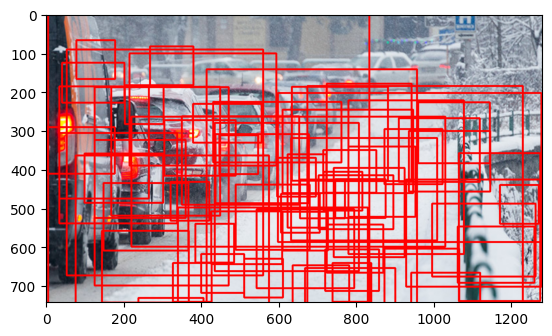

/kaggle/working/Dataset/labels/val/rain_storm-859.txt


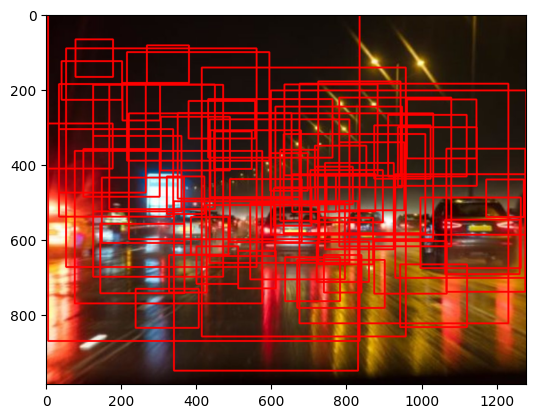

/kaggle/working/Dataset/labels/val/snow_storm-329.txt


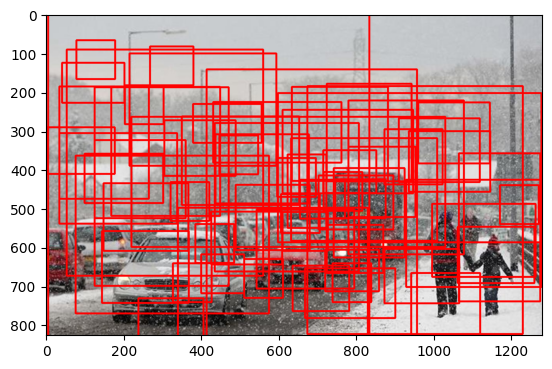

/kaggle/working/Dataset/labels/val/snow_storm-267.txt


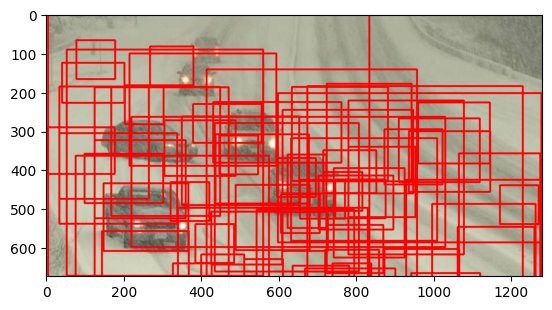

/kaggle/working/Dataset/labels/val/foggy-061.txt


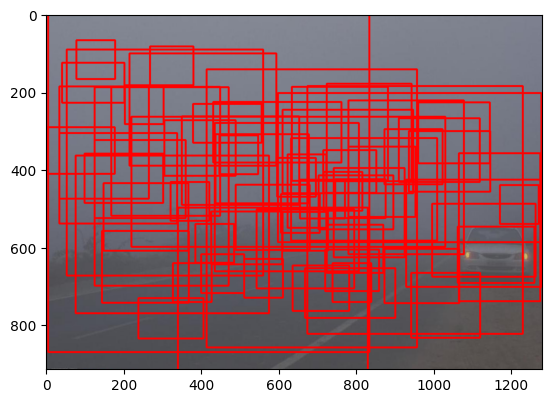

/kaggle/working/Dataset/labels/val/foggy-106.txt


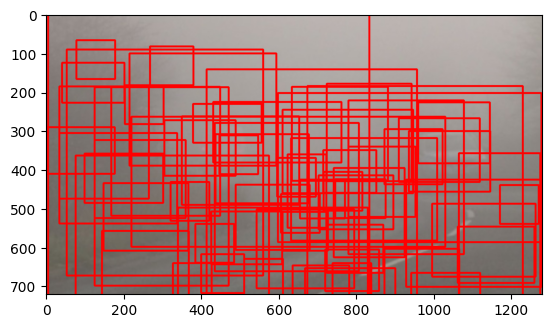

/kaggle/working/Dataset/labels/val/mist-075.txt


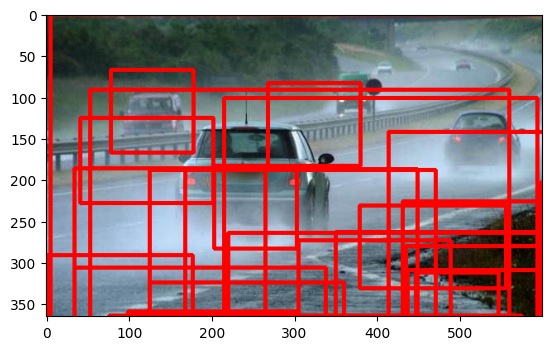

/kaggle/working/Dataset/labels/val/haze-087.txt


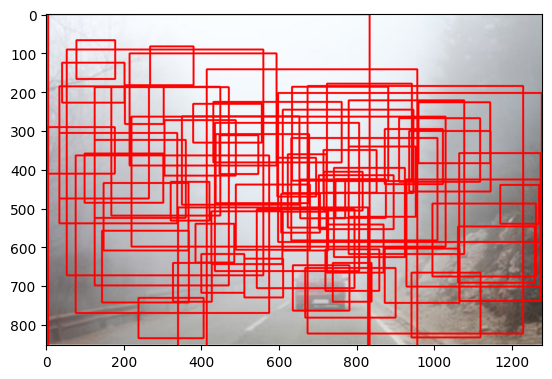

/kaggle/working/Dataset/labels/val/snow_storm-327.txt


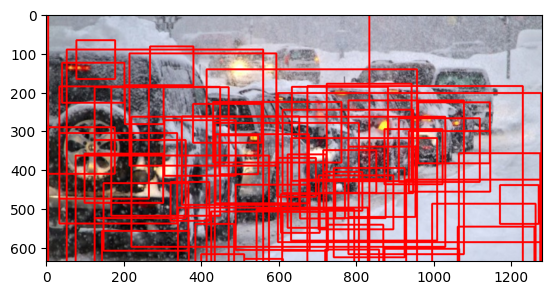

/kaggle/working/Dataset/labels/val/haze-106.txt


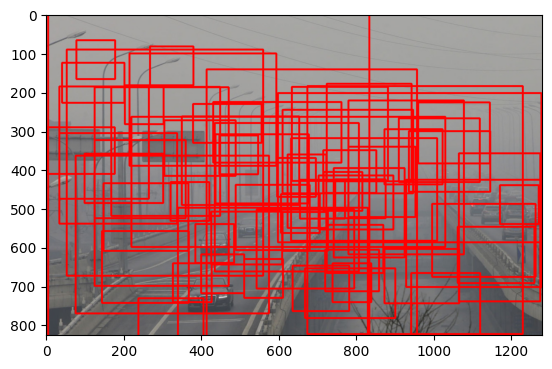

/kaggle/working/Dataset/labels/val/rain_storm-851.txt


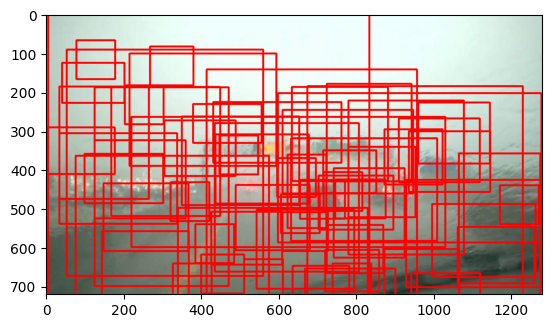

/kaggle/working/Dataset/labels/val/snow_storm-237.txt


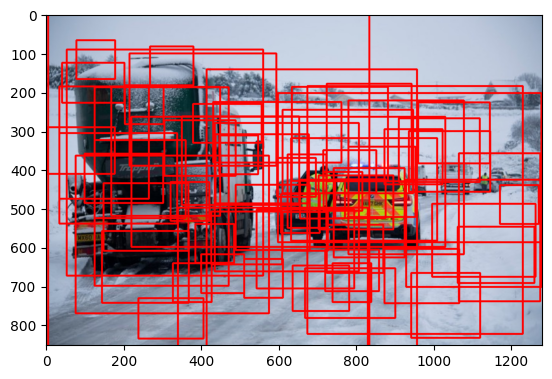

/kaggle/working/Dataset/labels/val/haze-136.txt


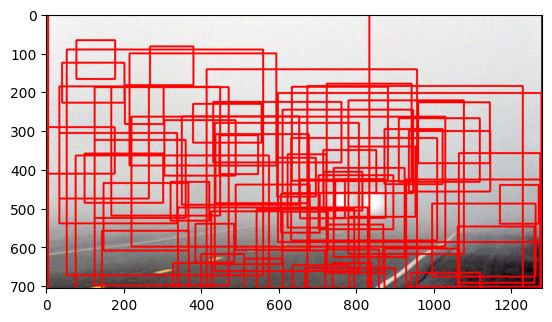

/kaggle/working/Dataset/labels/val/rain_storm-700.txt


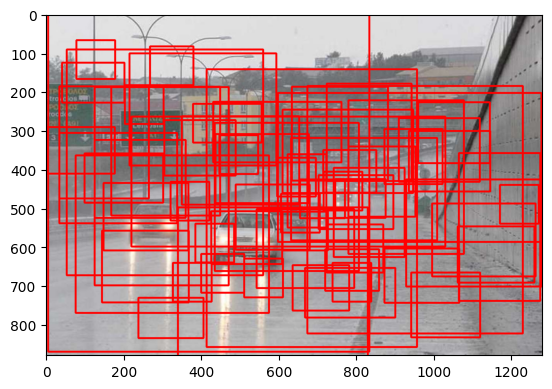

/kaggle/working/Dataset/labels/val/haze-048.txt


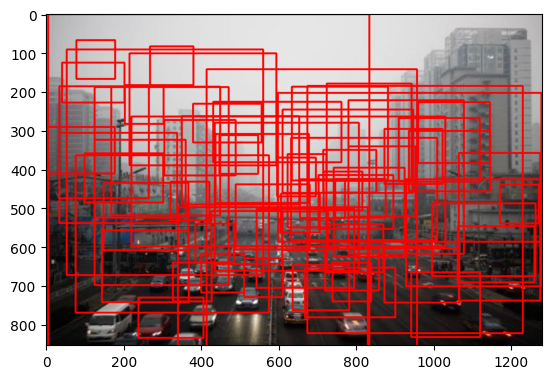

/kaggle/working/Dataset/labels/val/rain_storm-022.txt


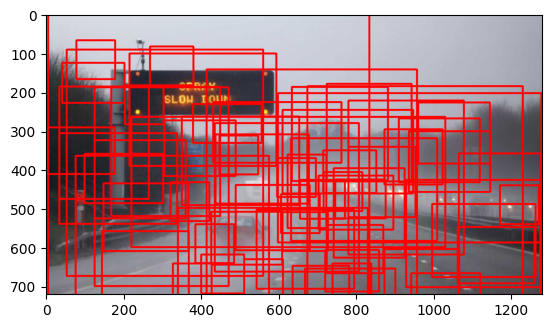

/kaggle/working/Dataset/labels/val/snow_storm-172.txt


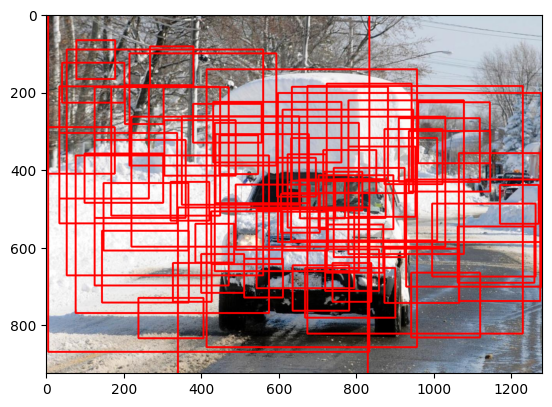

/kaggle/working/Dataset/labels/val/snow_storm-217.txt


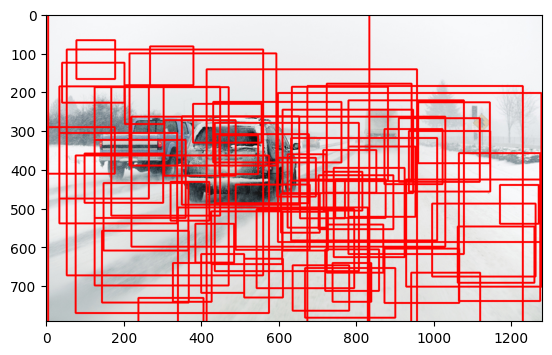

/kaggle/working/Dataset/labels/val/snow_storm-149.txt


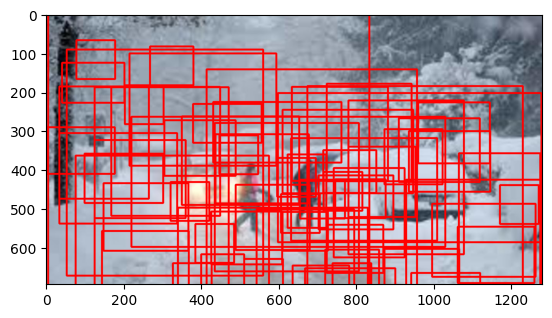

/kaggle/working/Dataset/labels/val/haze-056.txt


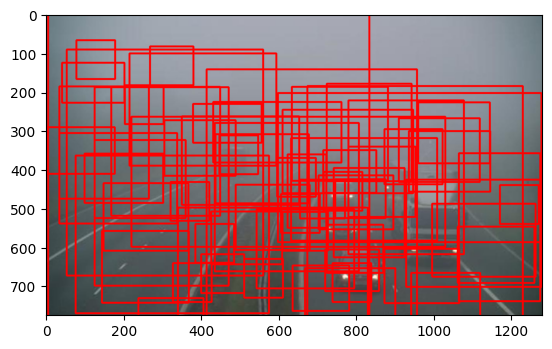

/kaggle/working/Dataset/labels/val/snow_storm-147.txt


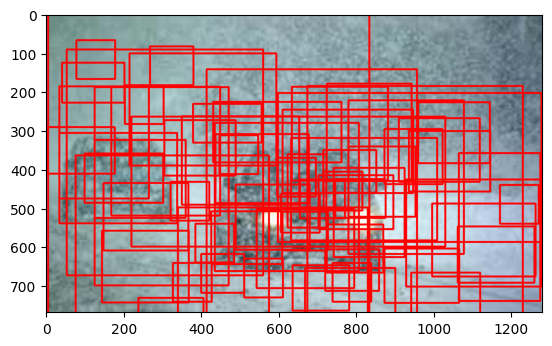

/kaggle/working/Dataset/labels/val/haze-098.txt


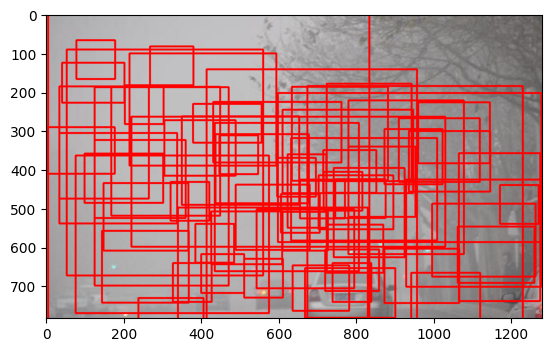

/kaggle/working/Dataset/labels/val/foggy-028.txt


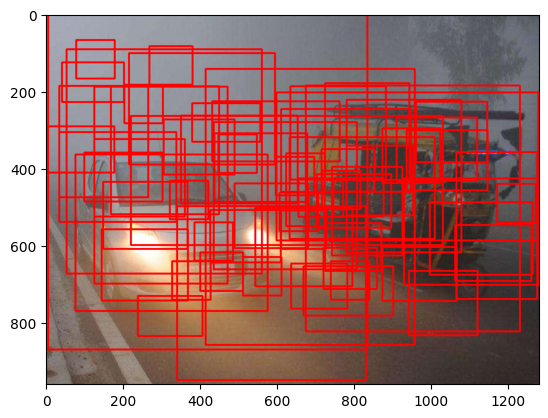

/kaggle/working/Dataset/labels/val/rain_storm-568.txt


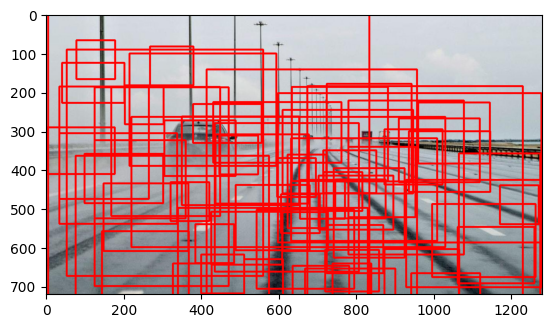

/kaggle/working/Dataset/labels/val/foggy-079.txt


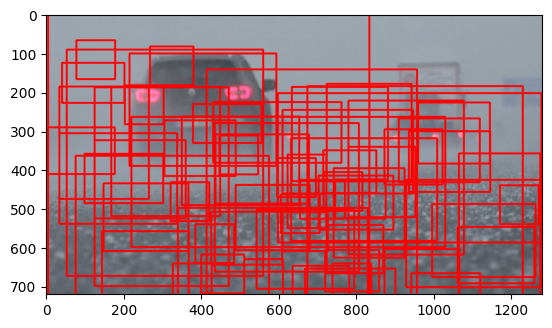

/kaggle/working/Dataset/labels/val/snow_storm-082.txt


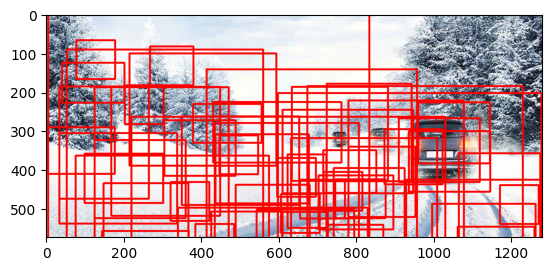

/kaggle/working/Dataset/labels/val/haze-040.txt


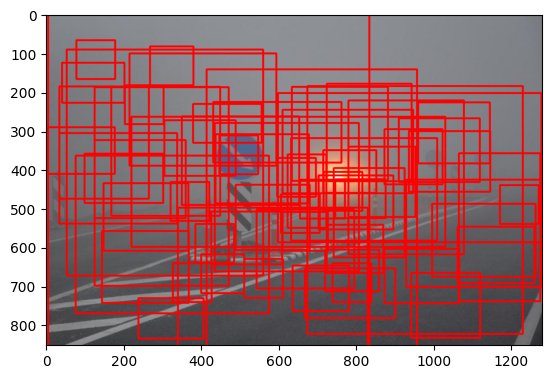

/kaggle/working/Dataset/labels/val/rain_storm-158.txt


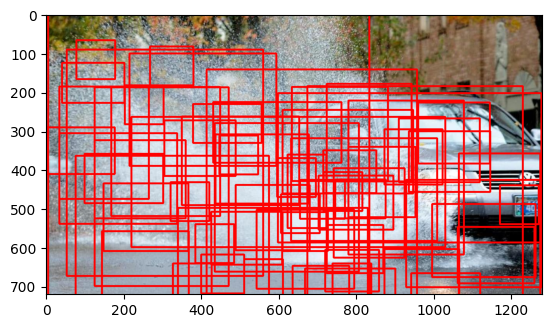

/kaggle/working/Dataset/labels/val/snow_storm-188.txt


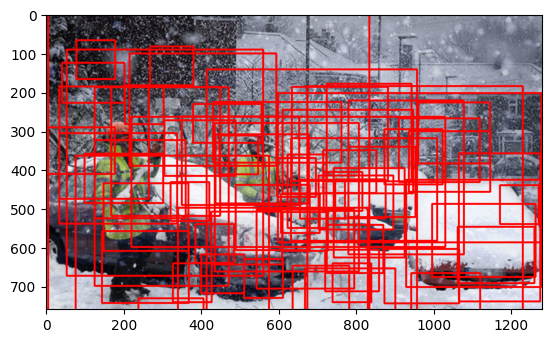

/kaggle/working/Dataset/labels/val/snow_storm-143.txt


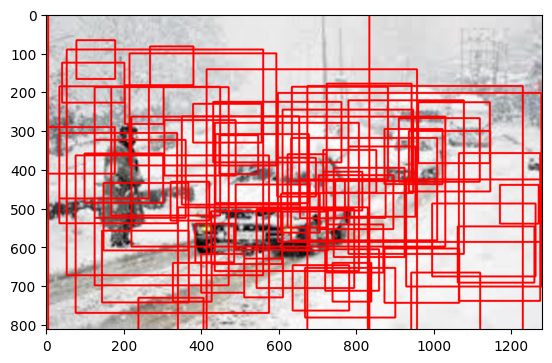

/kaggle/working/Dataset/labels/val/mist-080.txt


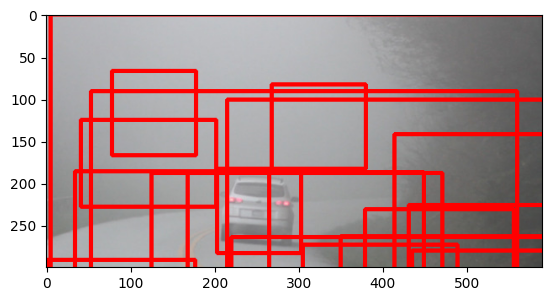

/kaggle/working/Dataset/labels/val/foggy-095.txt


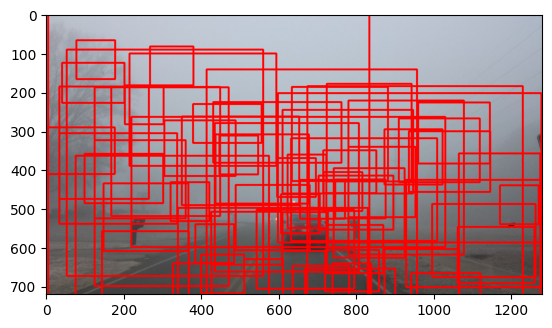

/kaggle/working/Dataset/labels/val/haze-111.txt


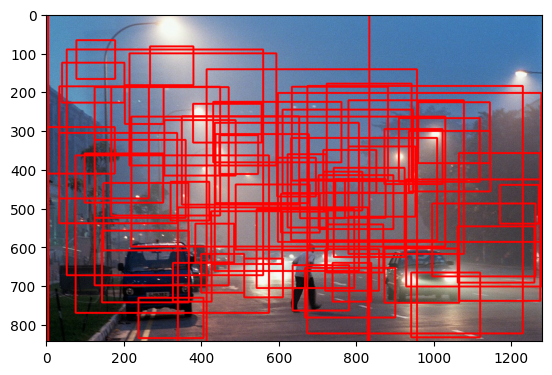

/kaggle/working/Dataset/labels/val/mist-122.txt


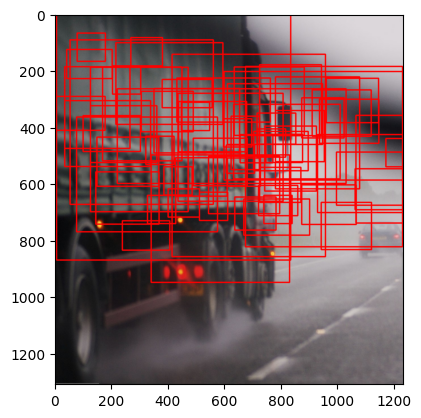

/kaggle/working/Dataset/labels/val/foggy-018.txt


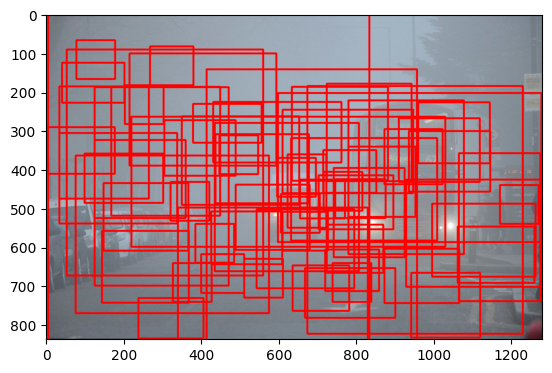

/kaggle/working/Dataset/labels/val/rain_storm-142.txt


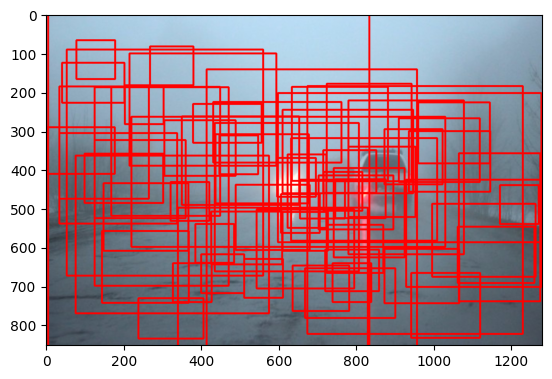

/kaggle/working/Dataset/labels/val/mist-922.txt


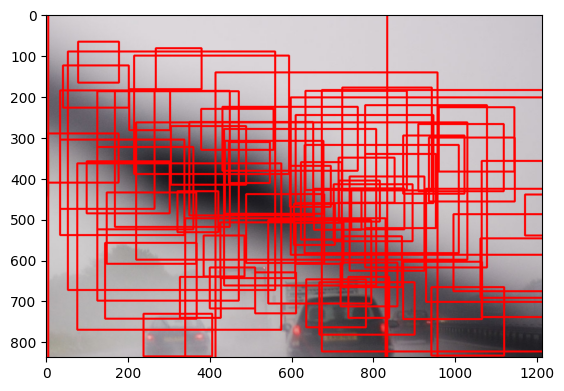

/kaggle/working/Dataset/labels/val/snow_storm-133.txt


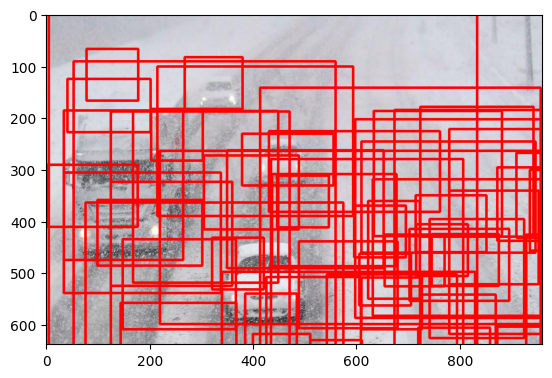

/kaggle/working/Dataset/labels/val/foggy-109.txt


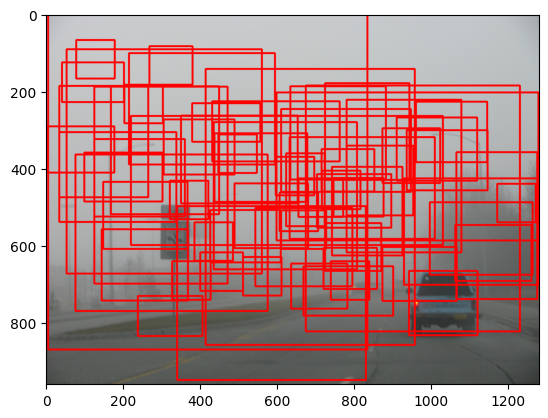

/kaggle/working/Dataset/labels/val/snow_storm-092.txt


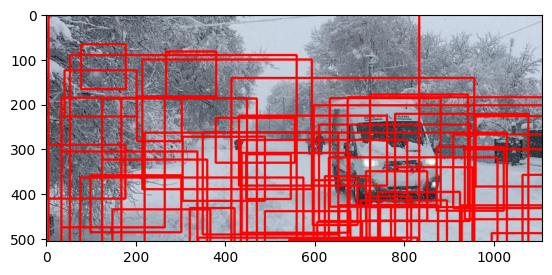

/kaggle/working/Dataset/labels/val/rain_storm-110.txt


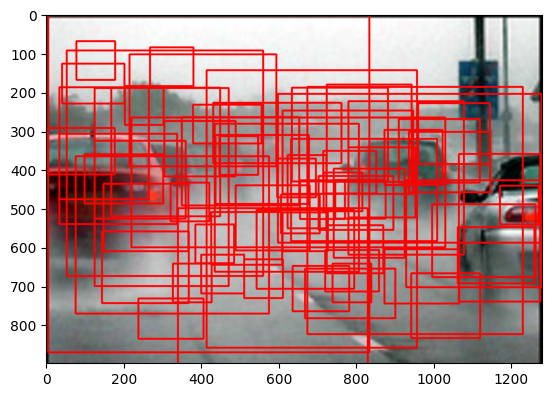

/kaggle/working/Dataset/labels/val/rain_storm-026.txt


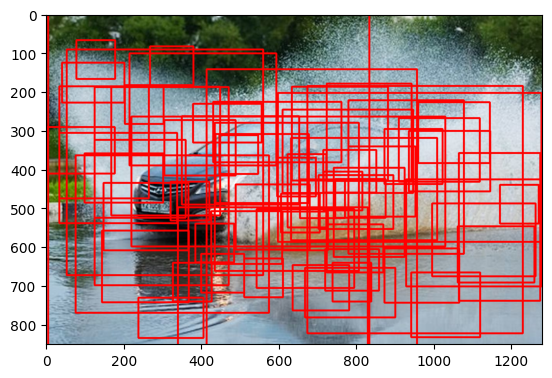

/kaggle/working/Dataset/labels/val/mist-137.txt


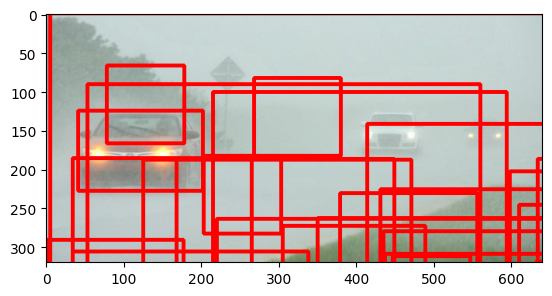

/kaggle/working/Dataset/labels/val/haze-090.txt


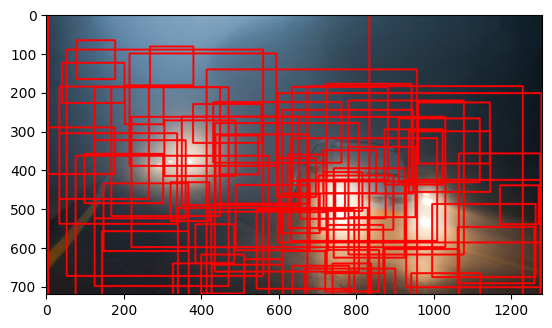

/kaggle/working/Dataset/labels/val/mist-084.txt


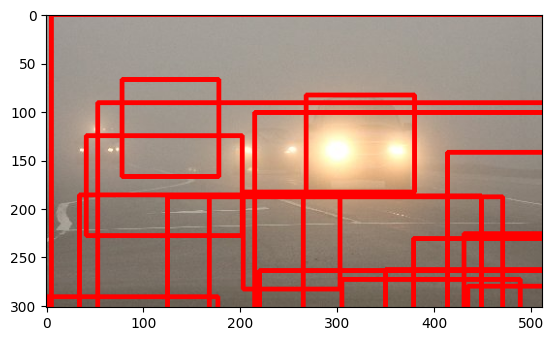

/kaggle/working/Dataset/labels/val/snow_storm-259.txt


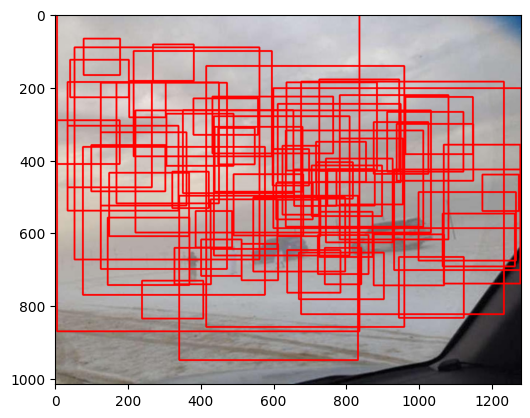

/kaggle/working/Dataset/labels/val/snow_storm-060.txt


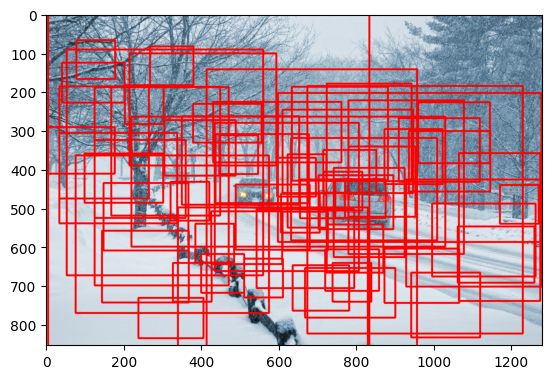

/kaggle/working/Dataset/labels/val/snow_storm-067.txt


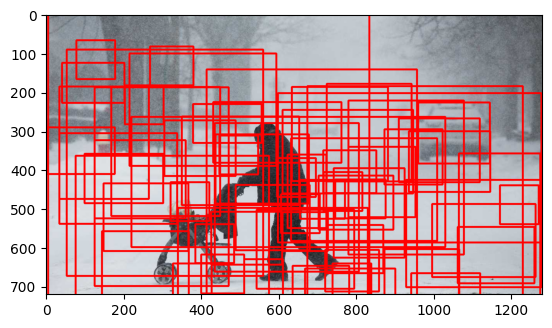

/kaggle/working/Dataset/labels/val/rain_storm-692.txt


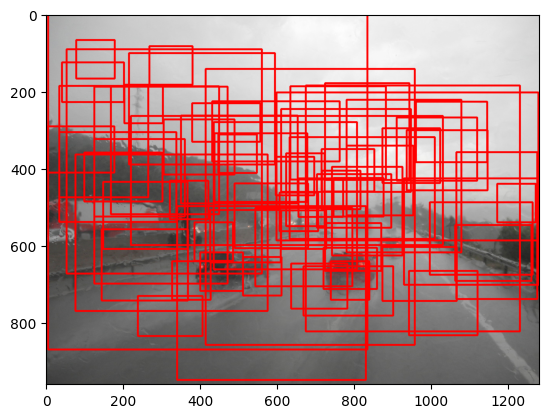

/kaggle/working/Dataset/labels/val/snow_storm-088.txt


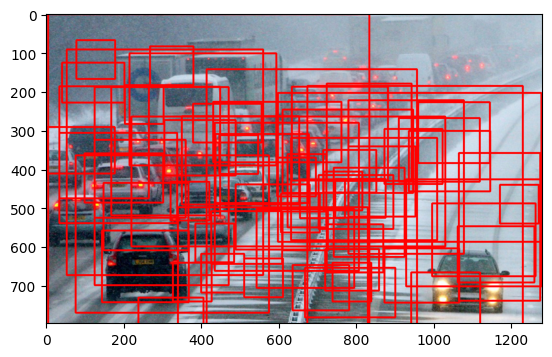

/kaggle/working/Dataset/labels/val/rain_storm-351.txt


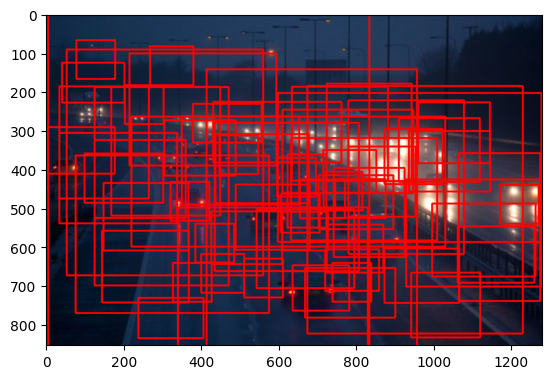

/kaggle/working/Dataset/labels/val/snow_storm-215.txt


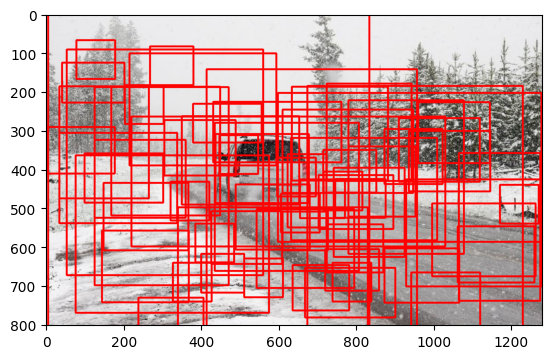

/kaggle/working/Dataset/labels/val/haze-018.txt


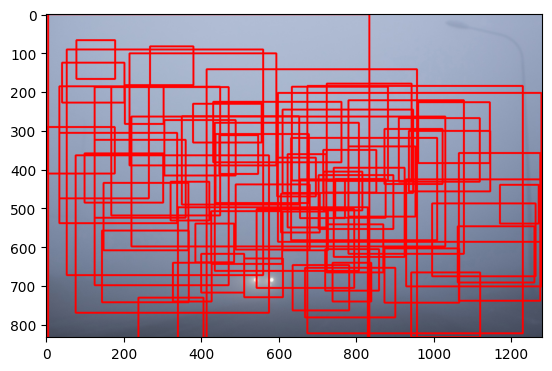

/kaggle/working/Dataset/labels/val/snow_storm-343.txt


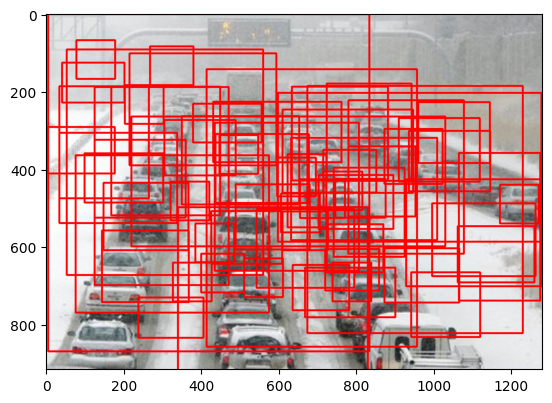

/kaggle/working/Dataset/labels/val/foggy-038.txt


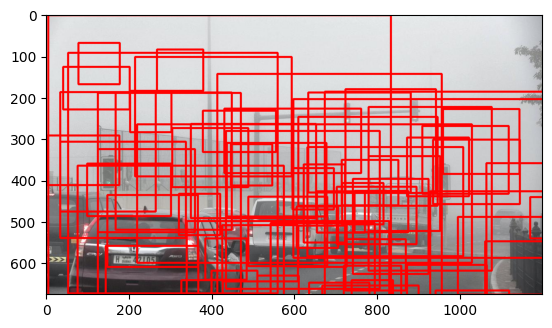

/kaggle/working/Dataset/labels/val/mist-049.txt


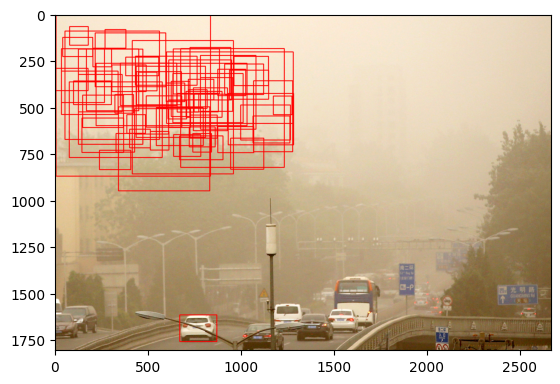

/kaggle/working/Dataset/labels/val/mist-027.txt


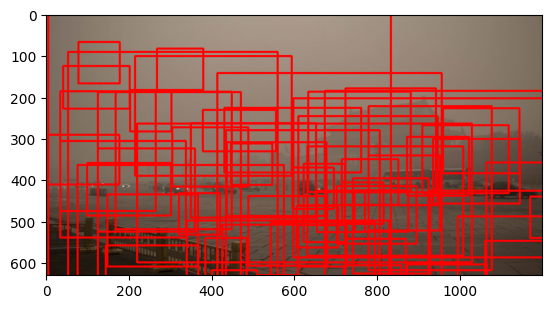

/kaggle/working/Dataset/labels/val/mist-114.txt


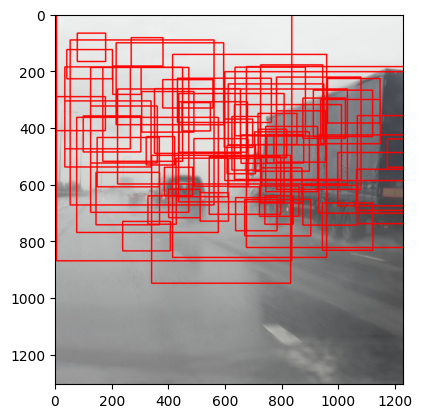

/kaggle/working/Dataset/labels/val/mist-955.txt


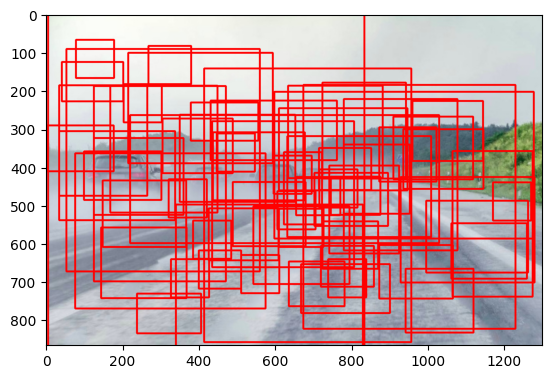

/kaggle/working/Dataset/labels/val/haze-007.txt


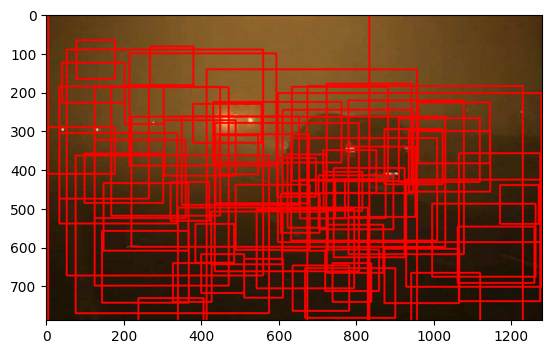

/kaggle/working/Dataset/labels/val/haze-148.txt


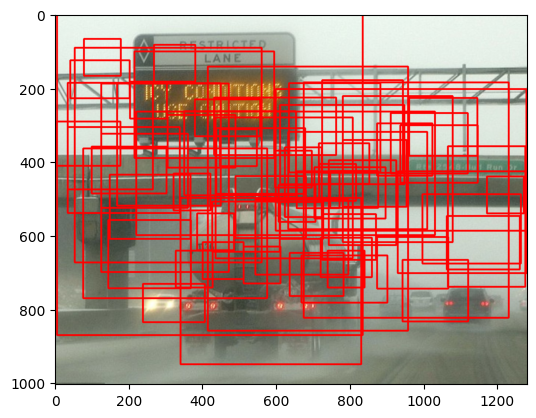

/kaggle/working/Dataset/labels/val/mist-068.txt


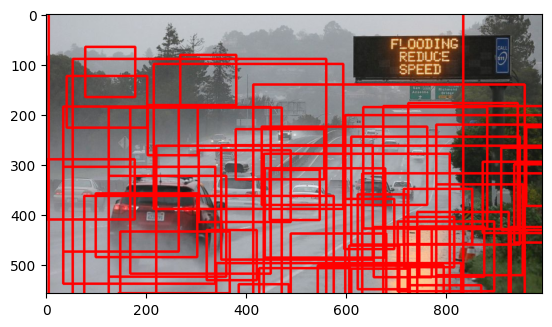

/kaggle/working/Dataset/labels/val/foggy-098.txt


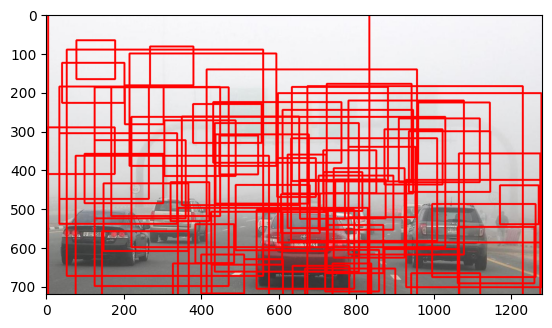

/kaggle/working/Dataset/labels/val/haze-096.txt


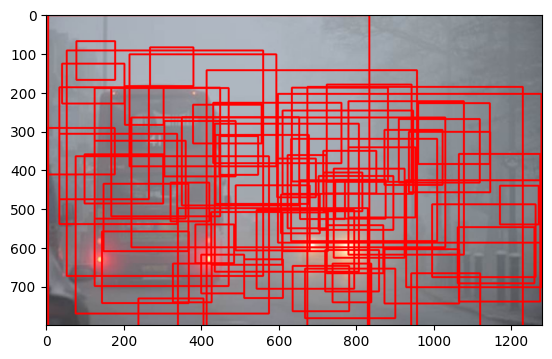

/kaggle/working/Dataset/labels/val/haze-094.txt


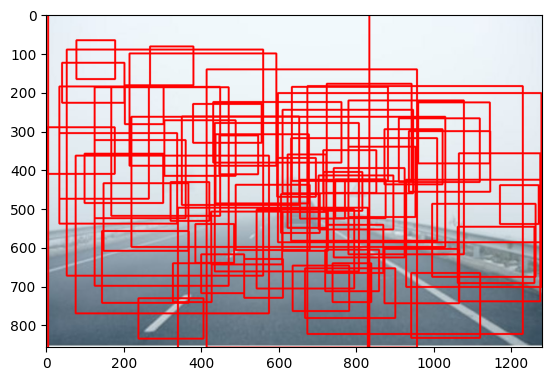

/kaggle/working/Dataset/labels/val/haze-016.txt


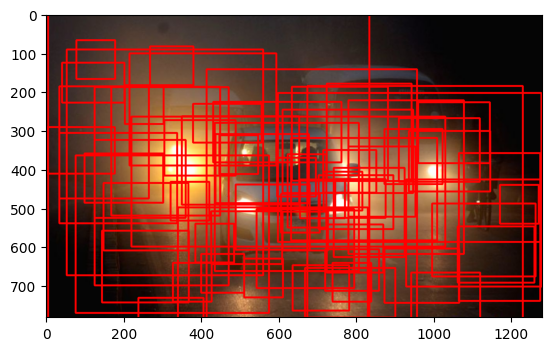

/kaggle/working/Dataset/labels/val/haze-069.txt


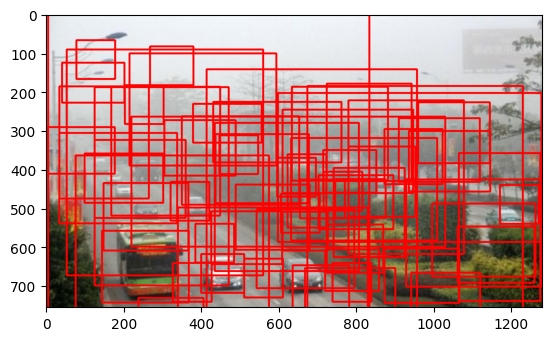

/kaggle/working/Dataset/labels/val/mist-138.txt


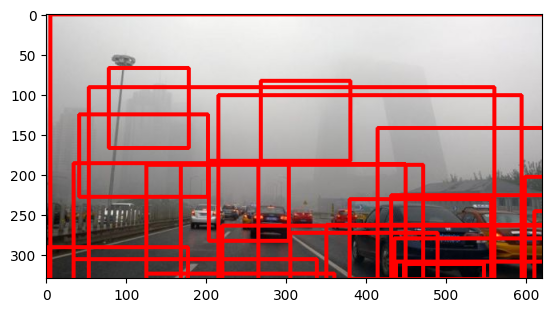

/kaggle/working/Dataset/labels/val/mist-016.txt


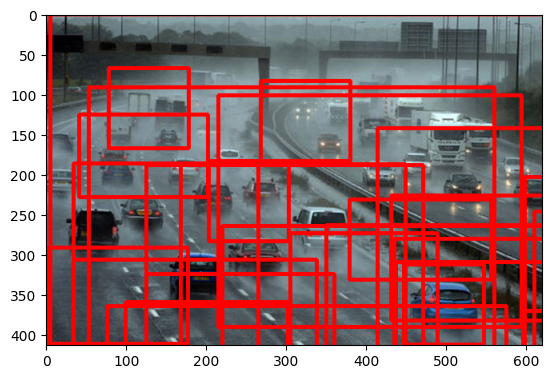

/kaggle/working/Dataset/labels/val/rain_storm-381.txt


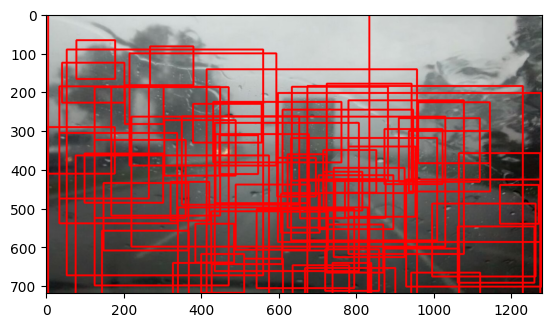

/kaggle/working/Dataset/labels/val/rain_storm-462.txt


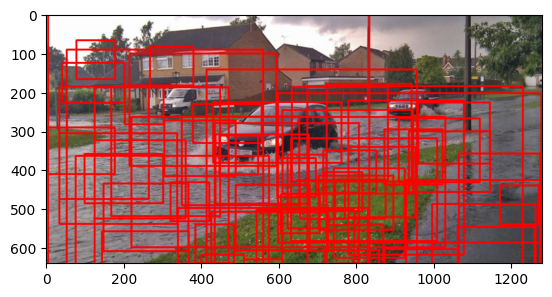

In [70]:
# make predictions on the validation set   
val_image_list = list(data_to_predict_path.glob('*.jpg'))  

# save the prediction in a csv file where the bounding boxes should have minimum size  
model.predict_and_save_to_csv(val_image_list, path_to_save_csv = path_to_save_bounding_box_val, minimum_size=100, threshold=0.25,  
                              only_most_conf=True)  

# draw bounding boxes from csv  
for image in val_image_list: 
    label_file = (dataset_path/'labels'/'val'/image.name).with_suffix('.txt')
    print(label_file)
    model.draw_bbox_from_csv(image, path_to_save_bounding_box_val)